# MNMST provides two strategies to integrate morphological information from histological images

In [1]:
import scanpy as sc
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics.cluster import adjusted_rand_score
import os
import scipy.sparse as sparse
import anndata

import seaborn as sns
from utils import refine, record_memory_usage
import time

sc.logging.print_header()
# sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3 # errors (0), warnings (1), info (2), hints (3)

sns.set_style("white")

np.random.seed(0)

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.26.4 scipy==1.14.0 pandas==2.2.2 scikit-learn==1.5.1 statsmodels==0.14.2 igraph==0.11.6 louvain==0.8.2 pynndescent==0.5.13


In [2]:
section_id = '151675'
adata = sc.read_visium(path='../Data/' + section_id, count_file=section_id + '_filtered_feature_bc_matrix.h5')
adata.var_names_make_unique()

reading ..\Data\151675\151675_filtered_feature_bc_matrix.h5
 (0:00:00)


In [3]:
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.highly_variable_genes(adata, flavor='seurat_v3', n_top_genes=3000)
hvg_filter = adata.var['highly_variable']
sc.pp.normalize_total(adata, inplace=True)
adata_all_genes = adata.copy()
adata = adata[:, hvg_filter]
display(adata)

filtered out 17476 genes that are detected in less than 10 cells
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)


View of AnnData object with n_obs × n_vars = 3592 × 3000
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'spatial', 'hvg'
    obsm: 'spatial'

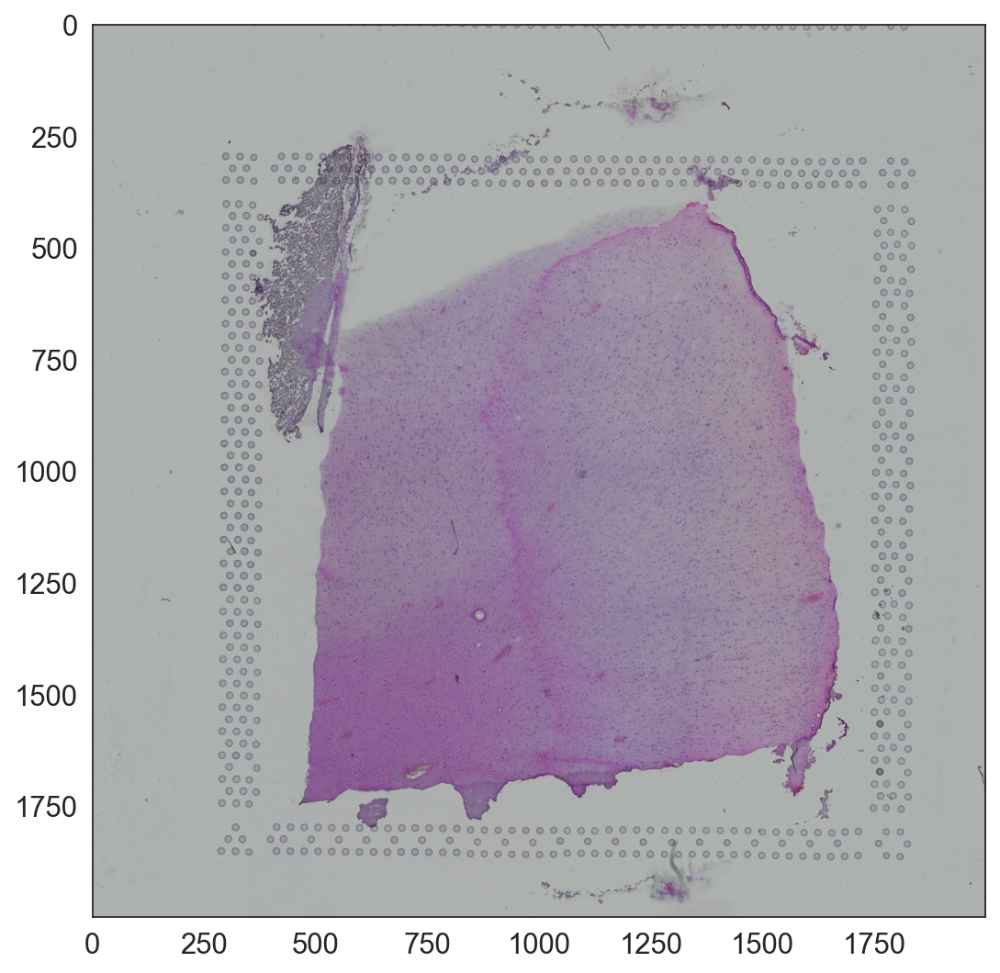

In [4]:
from pathlib import Path

spatial = pd.read_csv("../Data/151675/spatial/tissue_positions_list.csv", sep=",", header=None, na_filter=False, index_col=0)
spatial = spatial[spatial[1] == 1]

adata.obs["x2"] = spatial[2]
adata.obs["x3"] = spatial[3]
adata.obs["x4"] = spatial[4]
adata.obs["x5"] = spatial[5]


img = adata.uns['spatial'][section_id]['images']['hires']
scale_fact = adata.uns['spatial'][section_id]['scalefactors']['tissue_hires_scalef']
plt.imshow(img)

In [11]:
# Set coordinates
adata.obs["x_array"] = adata.obs["x2"]
adata.obs["y_array"] = adata.obs["x3"]
adata.obs["x_pixel"] = adata.obs["x4"] * scale_fact
adata.obs["y_pixel"] = adata.obs["x5"] * scale_fact

### Fix bugs in [issue#2](https://github.com/xkmaxidian/MNMST/issues/2)

In [12]:
adata.obs["x_pixel"] = [int(x) for x in adata.obs["x_pixel"]]
adata.obs["y_pixel"] = [int(y) for y in adata.obs["y_pixel"]]

x_array = adata.obs["x_array"].tolist()
y_array = adata.obs["y_array"].tolist()
x_pixel = adata.obs["x_pixel"].tolist()
y_pixel = adata.obs["y_pixel"].tolist()

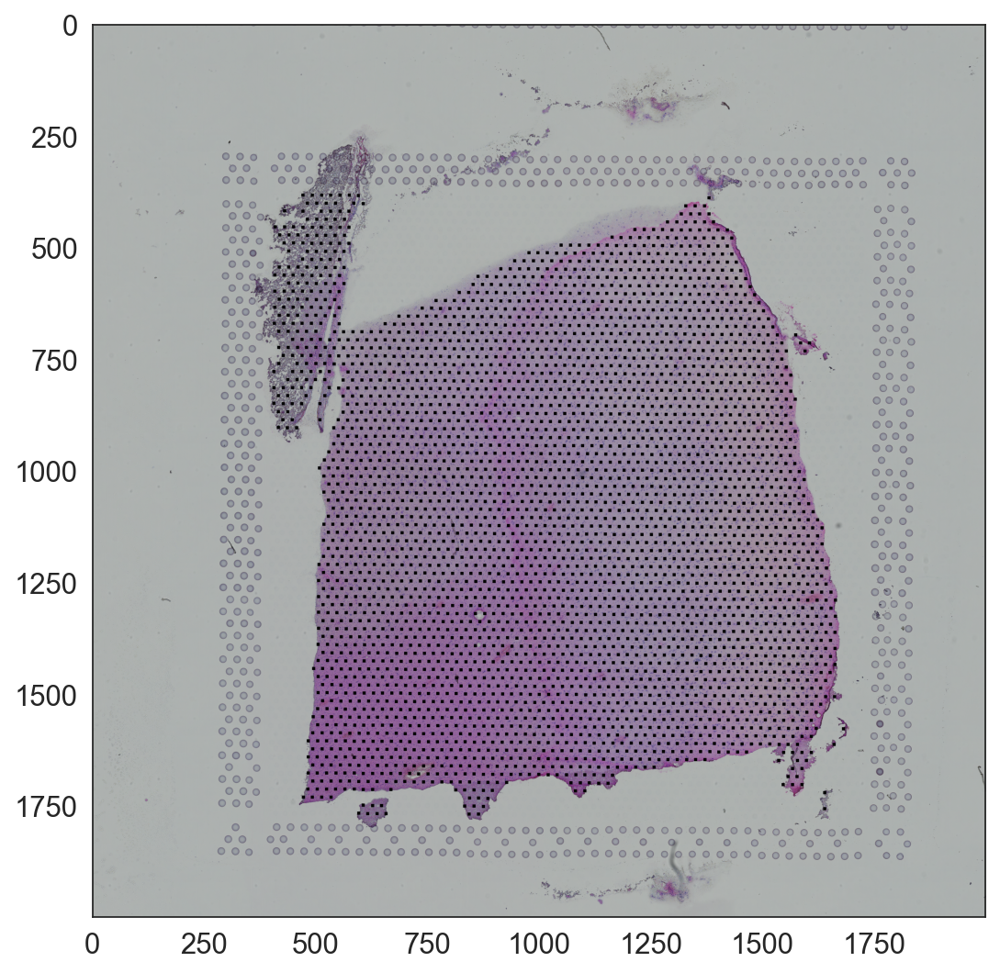

In [14]:
# Test coordinates on the image
img_new = img.copy()
for i in range(len(x_pixel)):
    x = x_pixel[i]
    y = y_pixel[i]
    img_new[int(x - 20 * scale_fact):int(x + 20 * scale_fact), int(y - 20 * scale_fact):int(y + 20 * scale_fact), :] = 0
plt.imshow(img_new)

## Strategy 1:
### Inspired by SpaGCN, we extends the 2D space in the tissue slice into a 3D space that incorporates histology information.
#### For spot $v$, we map it to the histology image according to its pixel coordinates $(x_{pv}, y_{pv})$, and draws a square centered on $(x_{pv}, y_{pv})$ containing 50 × 50 pixels and calculates the mean color value for the RGB channels, $(r_v, g_v, b_v)$, of all pixels that fall in the square. Then calculate a weighted sum of the RGB values as follows:
$$
z_v = \frac{r_v \times V_r + g_v \times V_g + b_v \times V_b} {V_r + V_g + V_b}
$$
and the coordinates of spot $v$ are set to be $(x_v, y_v, z_v)$ in the extended 3D space. Finally, the euclidean distance between every two spots $u$ and $v$ is calculated as:
$$
d(u, v) = \sqrt{(x_u - x_v)^2 + (y_u - y_v)^2 + (z_u - z_v)^2}
$$

In [15]:
import SpaGCN as spg
# Calculate distance matrix
b = 49
a = 1
adj = spg.calculate_adj_matrix(x=x_pixel, y=y_pixel, x_pixel=x_pixel, y_pixel=y_pixel, image=img, beta=b, alpha=a, histology=True)

Calculateing adj matrix using histology image...
Var of c0,c1,c2 =  0.0006027065 0.0026511813 0.0004375058
Var of x,y,z =  122472.51654474679 109225.92385384682 122472.50724103731


and we conver the distance matrix into adjacency matrix, where the edge weight between spot $u$ and spot $v$ is defiend as:
$$
w(u, v) = exp(-\frac{d(u, v)^2}{2l^2})
$$

In [16]:
p = 0.5
l = spg.find_l(p=p, adj=adj, start=10, end=1000, tol=0.01)
adj_exp = np.exp(-1 * (adj ** 2) / (2 * (l ** 2)))

L= 10.0 P= 0.14633
L= 10.01 P= 0.14711
L= 10.02 P= 0.14789
L= 10.03 P= 0.14867
L= 10.04 P= 0.14946
L= 10.049999999999999 P= 0.15025
L= 10.059999999999999 P= 0.15104
L= 10.069999999999999 P= 0.15183
L= 10.079999999999998 P= 0.15262
L= 10.089999999999998 P= 0.15342
L= 10.099999999999998 P= 0.15422
L= 10.109999999999998 P= 0.15502
L= 10.119999999999997 P= 0.15582
L= 10.129999999999997 P= 0.15663
L= 10.139999999999997 P= 0.15744
L= 10.149999999999997 P= 0.15825
L= 10.159999999999997 P= 0.15906
L= 10.169999999999996 P= 0.15987
L= 10.179999999999996 P= 0.16069
L= 10.189999999999996 P= 0.16151
L= 10.199999999999996 P= 0.16233
L= 10.209999999999996 P= 0.16315
L= 10.219999999999995 P= 0.16398
L= 10.229999999999995 P= 0.1648
L= 10.239999999999995 P= 0.16563
L= 10.249999999999995 P= 0.16646
L= 10.259999999999994 P= 0.1673
L= 10.269999999999994 P= 0.16813
L= 10.279999999999994 P= 0.16897
L= 10.289999999999994 P= 0.16981
L= 10.299999999999994 P= 0.17065
L= 10.309999999999993 P= 0.1715
L= 10.3199999

### We plot the constructed topology graph, and found that most nodes have lost adjacencies

Maximum weight: 1.0



(2284.9, 11637.1, -12267.2, -2098.8)

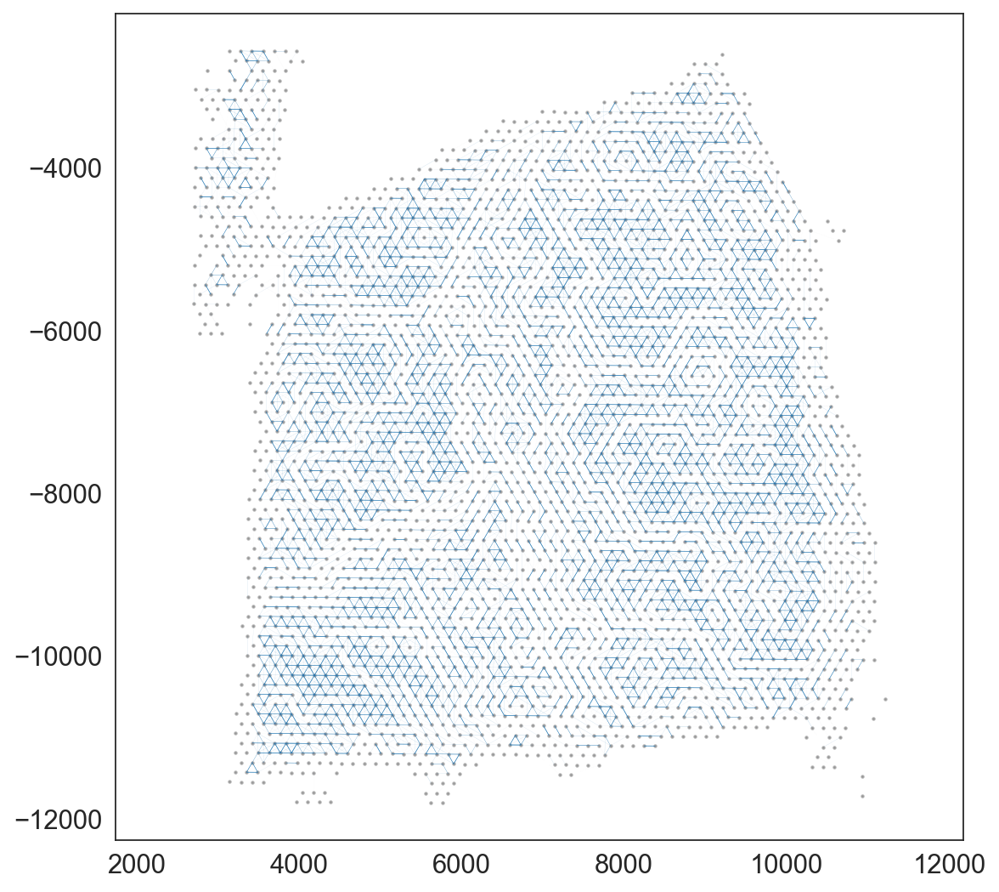

In [17]:
from utils import plot_graph_weights
position = adata.obsm['spatial'].copy()
position[:, 1] = -position[:, 1]
plot_graph_weights(position, sparse.csr_matrix(adj_exp), max_weight=1, markersize=1, figsize=(8, 8))
ax = plt.gca()
ax.axis('equal')

In [18]:
from utils import row_normalize
weights_graph = row_normalize(sparse.csr_matrix(adj_exp), verbose=False)

In [19]:
from utils import weighted_concatenate, zscore, matrix_to_adata

gene_list = adata.var.index

nbrhood_contribution = 0.2

neighbour_agg_matrix = weights_graph @ adata.X

if sparse.issparse(adata.X):
    concatenated = sparse.hstack((adata.X, neighbour_agg_matrix), )
else:
    concatenated = np.concatenate((adata.X, neighbour_agg_matrix), axis=1,)

matrix = weighted_concatenate(zscore(adata.X, axis=0), zscore(neighbour_agg_matrix, axis=0), nbrhood_contribution)


if sparse.issparse(matrix):
    st_dev_pergene = matrix.toarray().std(axis=0)
else:
    st_dev_pergene = matrix.std(axis=0)

enhanced_data = matrix_to_adata(matrix, adata)
display(enhanced_data)

num_nbrs: 3000


AnnData object with n_obs × n_vars = 3592 × 6000
    obs: 'in_tissue', 'array_row', 'array_col', 'x2', 'x3', 'x4', 'x5', 'x_array', 'y_array', 'x_pixel', 'y_pixel'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'is_nbr'
    uns: 'spatial', 'hvg'
    obsm: 'spatial'

In [20]:
sc.pp.pca(enhanced_data, n_comps=50)
low_dim_x = enhanced_data.obsm['X_pca']

computing PCA
    with n_comps=50
    finished (0:00:01)


In [21]:
from sklearn.metrics.pairwise import cosine_similarity

n_spot = low_dim_x.shape[0]
n_neighbor = 15
init_W = cosine_similarity(low_dim_x)
cos_init = np.zeros((n_spot, n_spot))
for i in range(n_spot):
    vec = init_W[i, :]
    distance = vec.argsort()[:: -1]
    for t in range(n_neighbor + 1):
        y = distance[t]
        cos_init[i, y] = init_W[i, y]

In [22]:
# First, we convert the numpy data into tensor
from MNMST_gpu import sparse_self_representation_torch, MNMST_representation_gpu

import torch

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'
cos_init_tensor = torch.from_numpy(cos_init).float().to(device)
x_tensor = torch.from_numpy(low_dim_x.T.copy()).to(device)
C_gpu = sparse_self_representation_torch(x_tensor, init_w=cos_init_tensor, alpha=1., beta=1., device=device)

spatia_init_tensor = torch.from_numpy(adj_exp).float().to(device)
Z_gpu = MNMST_representation_gpu(C_gpu, spatia_init_tensor, device=device)

# Epoch 19, loss: 0.101:  20%|██        | 20/100 [00:04<00:16,  4.91it/s]


In [23]:
Z_gpu = Z_gpu.detach().cpu().numpy()

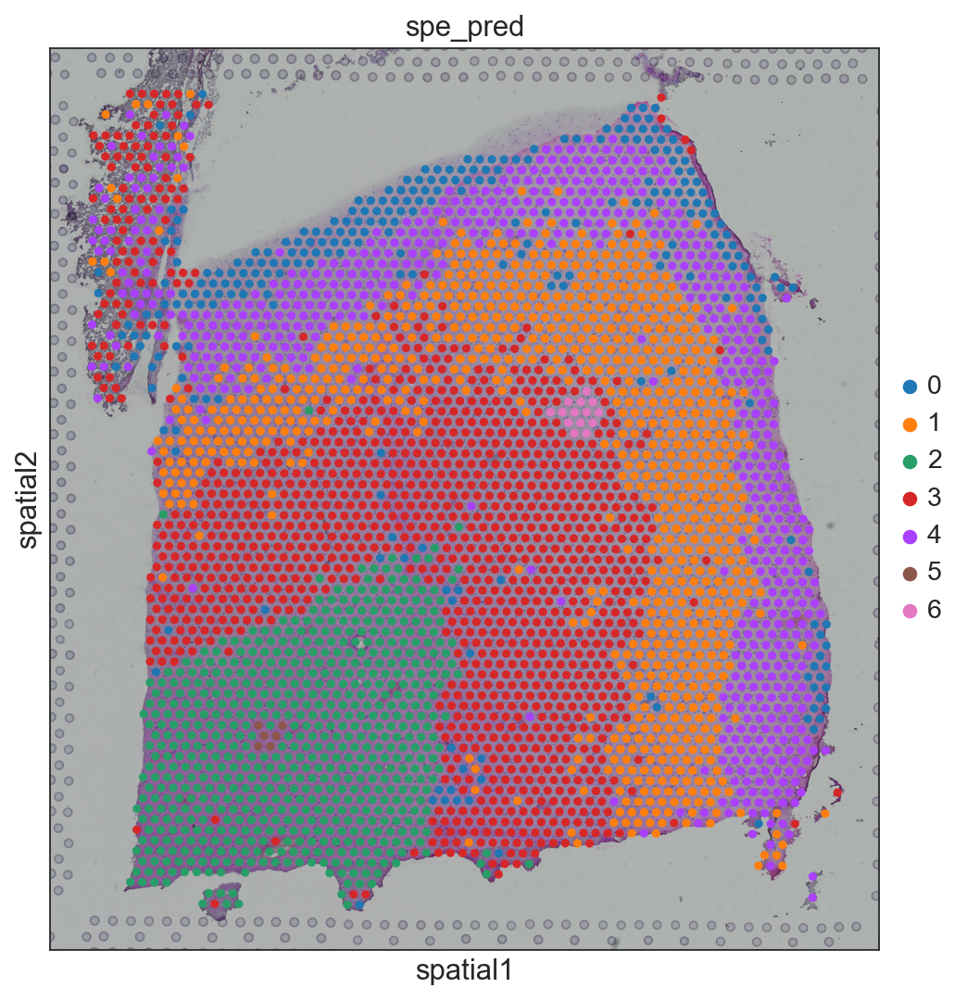

In [24]:
from sklearn.cluster import SpectralClustering

n_clusters = 7
spectral = SpectralClustering(n_clusters=n_clusters, affinity='precomputed')
labels = spectral.fit_predict(Z_gpu)

enhanced_data.obs['spe_pred'] = labels
enhanced_data.obs["spe_pred"] = enhanced_data.obs["spe_pred"].astype('int')
enhanced_data.obs['spe_pred'] = enhanced_data.obs['spe_pred'].astype('category')
sc.pl.spatial(enhanced_data, color=['spe_pred'])

### We observed that the integration of morphological information resulted in a discontinuity in the identified spatial domain. As reported in [MUSE](https://github.com/AltschulerWu-Lab/MUSE/issues/3), we argue that in normal human brain tissue sections, such as the DLPFC, the morphological changes between different spatial domains are not readily apparent. Consequently, integrating such information leads to a decline in spatial domain recognition performance.

running Leiden clustering
    finished: found 7 clusters and added
    'MNMST_GPU', the cluster labels (adata.obs, categorical) (0:00:11)
AAACAACGAATAGTTC-1    0
AAACAAGTATCTCCCA-1    0
AAACACCAATAACTGC-1    1
AAACAGAGCGACTCCT-1    0
AAACAGGGTCTATATT-1    4
                     ..
TTGTTGTGTGTCAAGA-1    3
TTGTTTCACATCCAGG-1    1
TTGTTTCATTAGTCTA-1    1
TTGTTTCCATACAACT-1    4
TTGTTTGTATTACACG-1    1
Name: MNMST_GPU, Length: 3592, dtype: category
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']


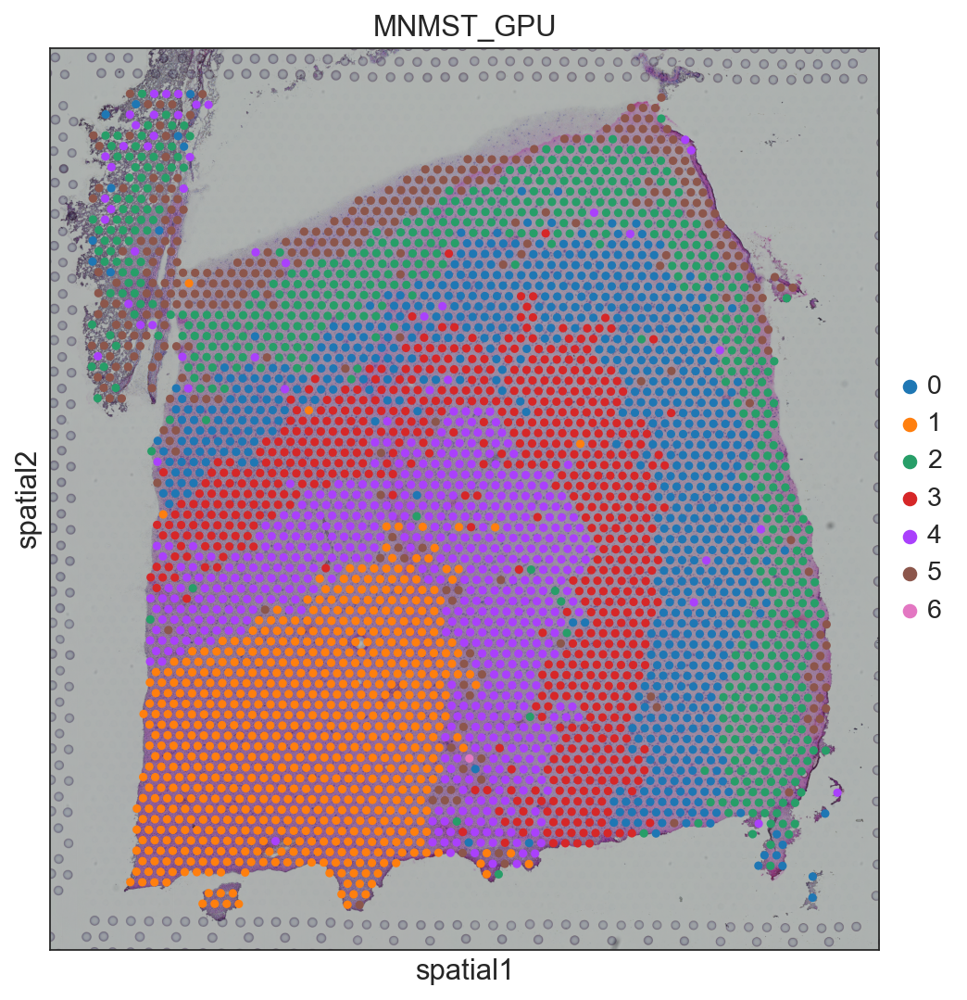

In [17]:
key_added = 'representation'
conns_key = 'representation'
dists_key = 'representation'

enhanced_data.uns[key_added] = {}
    
representation_dict = enhanced_data.uns[key_added]
    
representation_dict['connectivities_key'] = conns_key
representation_dict['distances_key'] = dists_key
representation_dict['var_names_use'] = enhanced_data.var_names.to_numpy()
    
representation_dict['params'] = {}
representation_dict['params']['method'] = 'umap'
enhanced_data.obsp['representation'] = Z_gpu
sc.tl.leiden(enhanced_data, neighbors_key='representation', resolution=1.25, key_added='MNMST_GPU')
print(enhanced_data.obs['MNMST_GPU'])
sc.pl.spatial(enhanced_data, color=['MNMST_GPU'])

## Strategy 2:
### We utilize a deep network model (ResNet50) to extract morphological features and build a morphological network $W^{[i]}$ based on cosine similarity.  After that, MNMST treats the morphological network as one layer in the multi-layer network. Then, the objective of MNMST is formulated as:
\begin{equation}\label{eq:self_rep_final}
	\begin{aligned}
		& \|W^{[i]}-B{F^{[i]}}\|^2 + \|W^{[e]}-B{F^{[e]}}\|^2+\|M^{[s]}-B{F^{[s]}}\|^2 + \gamma\|Z\|_{*}+\lambda\|E\|_{2,1}\\
		& \text{s.t.} \quad B\geq 0, F^{[e]} \geq 0, F^{[s]} \geq 0, F^{[i]} \geq 0, B'={B'}Z+E.
	\end{aligned}
\end{equation}

We first segment the image according to pixel coordinates, and extract the morphological features of each image patch

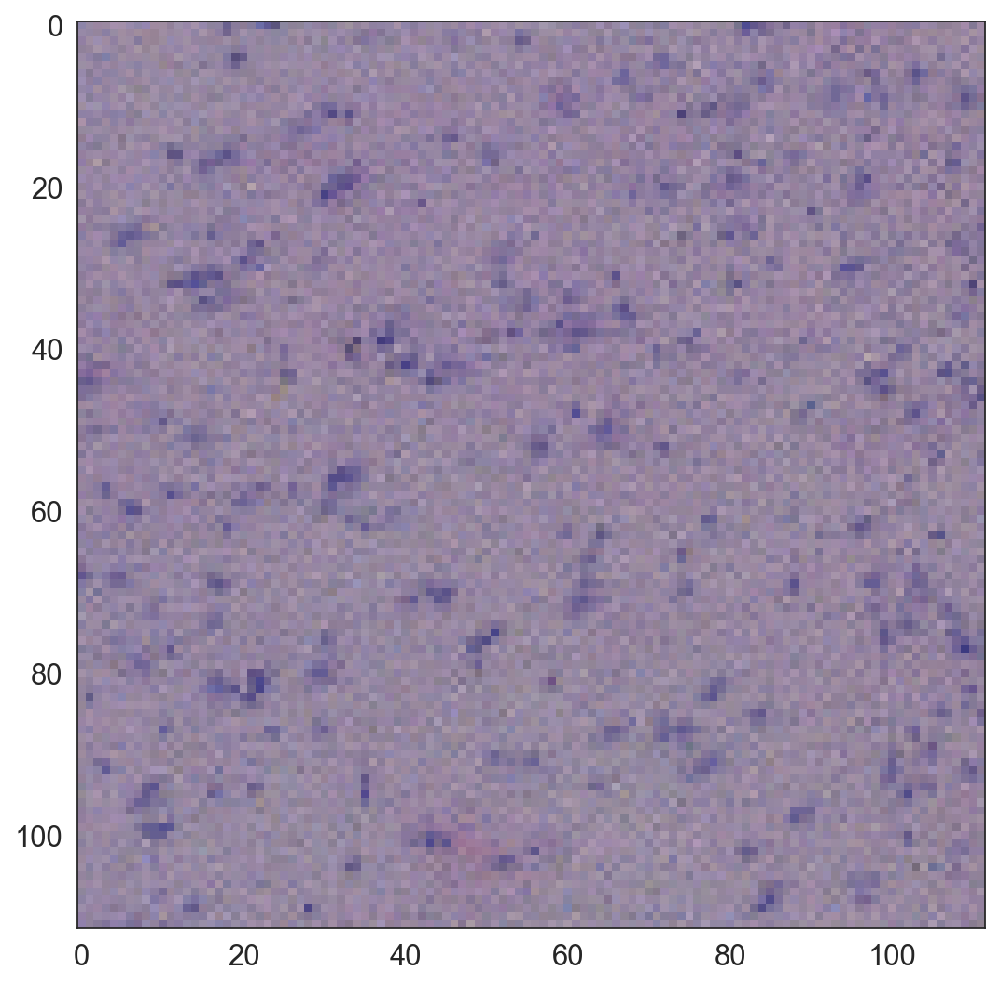

In [18]:
image = adata.uns["spatial"][section_id]['images']['hires']
scale_factor = adata.uns['spatial'][section_id]['scalefactors']['tissue_hires_scalef']
patches = []
crop_size = 56
for x, y in adata.obsm['spatial'] * scale_factor:
    patches.append(image[int(y - crop_size): int(y + crop_size), int(x - crop_size): int(x + crop_size)])
    
plt.imshow(patches[1000])

We then load the pre-trained DNN model to extract morphological features

In [19]:
import torchvision.models as models
import torch.nn as nn
import torch
from torchtoolbox.transform import Cutout
from torchvision import transforms
from tqdm import tqdm

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

# define ResNet 50 model and extract morphological information
def load_cnn_model():
    image_encoder = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
    image_encoder.fc = nn.Identity()
    image_encoder = image_encoder.to(device)
    return image_encoder

img_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

model = load_cnn_model()
model.eval()
feature_df = []

with tqdm(total=len(patches), desc='Extract image feature', bar_format='{l_bar}{bar} [ time left: {remaining} ]', ) as pbar:
    for image_patch in patches:
        tensor = img_transform(image_patch)
        tensor = tensor.reshape(1, 3, 112, 112)
        tensor = tensor.to(device)
        result = model(tensor)
        result_npy = result.data.cpu().numpy().ravel()
        feature_df.append(result_npy)
        pbar.update(1)

Extract image feature: 100%|██████████ [ time left: 00:00 ]


In [20]:
from sklearn.decomposition import PCA

feature_df = np.array(feature_df)
adata.obsm['image_feature'] = feature_df
print("The image feature is added to adata.obsm['image_feature']")

pca = PCA(n_components=200, random_state=42)
image_feature_pca = pca.fit_transform(feature_df)
adata.obsm['image_feat_pca'] = image_feature_pca
print("The pca result of image features is added to adata.obsm['image_feat_pca']")

The image feature is added to adata.obsm['image_feature']
The pca result of image features is added to adata.obsm['image_feat_pca']


In [21]:
pca.explained_variance_ratio_.sum()

0.9599949

We use *phenograph* package to visualize the results of spatial domain identification solely based on morphological information. The findings here confirm that, on these normal DLPFC datasets, morphological information alone is insufficient for accurately distinguishing between different spatial domains.

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.179701566696167 seconds
Jaccard graph constructed in 17.470248460769653 seconds
Wrote graph to binary file in 0.019999980926513672 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.86058
Louvain completed 21 runs in 1.673734188079834 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 23.60830330848694 seconds


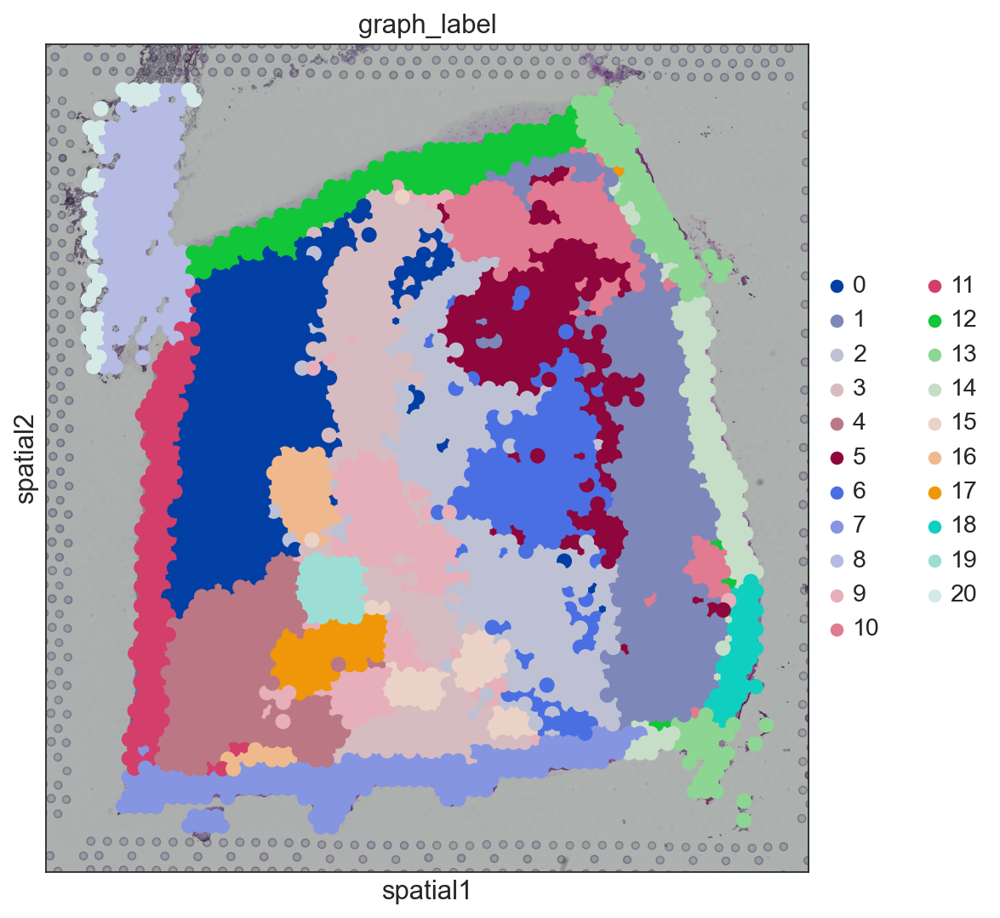

In [22]:
import phenograph
graph_label, _, _ = phenograph.cluster(image_feature_pca)
adata.obs['graph_label'] = graph_label
adata.obs['graph_label'] = adata.obs['graph_label'].astype('category')
sc.pl.spatial(adata, color='graph_label', size=2)

Now, let us construct the morphological similarity network $W^{[I]}$ and use MNMST to identify the spatial domain

In [23]:
from sklearn.metrics import pairwise_distances

morphological_similarity = 1 - pairwise_distances(np.array(adata.obsm['image_feat_pca']), metric='cosine')
morphological_network = np.zeros((n_spot, n_spot))
for i in range(n_spot):
    vec = morphological_similarity[i, :]
    distance = vec.argsort()[:: -1]
    for t in range(n_neighbor + 1):
        y = distance[t]
        morphological_network[i, y] = morphological_similarity[i, y]

Construct spatial network $W^{[s]}$, and enhance the expression data

In [26]:
from sklearn.neighbors import NearestNeighbors
from utils import plot_edge_histogram, generate_spatial_weights_fixed_nbrs

num_neighbours = 6
nbrs = NearestNeighbors(algorithm='ball_tree').fit(adata.obsm['spatial'])
distances, indices = nbrs.kneighbors(n_neighbors=num_neighbours)
median_cell_distance = np.median(distances)
weights_graph, distance_graph = generate_spatial_weights_fixed_nbrs(adata.obsm['spatial'], num_neighbours=num_neighbours, decay_type='reciprocal', nbr_object=nbrs, verbose=False)
nbrhood_contribution = 0.2
neighbour_agg_matrix = weights_graph @ adata.X
if sparse.issparse(adata.X):
    concatenated = sparse.hstack((adata.X, neighbour_agg_matrix), )
else:
    concatenated = np.concatenate((adata.X, neighbour_agg_matrix), axis=1,)

matrix = weighted_concatenate(zscore(adata.X, axis=0), zscore(neighbour_agg_matrix, axis=0), nbrhood_contribution)
if sparse.issparse(matrix):
    st_dev_pergene = matrix.toarray().std(axis=0)
else:
    st_dev_pergene = matrix.std(axis=0)

enhanced_data = matrix_to_adata(matrix, adata)
display(enhanced_data)

num_nbrs: 3000


AnnData object with n_obs × n_vars = 3592 × 6000
    obs: 'in_tissue', 'array_row', 'array_col', 'x2', 'x3', 'x4', 'x5', 'x_array', 'y_array', 'x_pixel', 'y_pixel', 'graph_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'is_nbr'
    uns: 'spatial', 'hvg', 'pca', 'spe_pred_colors', 'representation', 'leiden', 'MNMST_GPU_colors', 'graph_label_colors'
    obsm: 'spatial', 'image_feature', 'image_feat_pca'

In [27]:
sc.pp.pca(enhanced_data, n_comps=100)
low_dim_x = enhanced_data.obsm['X_pca']

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:02)


MNMST part

In [28]:
from MNMST_gpu import MNMST_representation_with_histology_gpu


n_spot = low_dim_x.shape[0]
n_neighbor = 15
init_W = cosine_similarity(low_dim_x)
cos_init = np.zeros((n_spot, n_spot))
for i in range(n_spot):
    vec = init_W[i, :]
    distance = vec.argsort()[:: -1]
    for t in range(n_neighbor + 1):
        y = distance[t]
        cos_init[i, y] = init_W[i, y]

In [29]:
morphological_network.shape, weights_graph.shape

((3592, 3592), (3592, 3592))

In [36]:
x_tensor = torch.from_numpy(low_dim_x.T.copy()).to(device)
spatia_init_tensor = torch.from_numpy(weights_graph.A).float().to(device)
morph_init_tensor = torch.from_numpy(morphological_network).float().to(device)
cos_init_tensor = torch.from_numpy(cos_init).float().to(device)

C_gpu = sparse_self_representation_torch(x_tensor, init_w=cos_init_tensor, alpha=1., beta=1., device=device)
Z_gpu = MNMST_representation_with_histology_gpu(network_his=morph_init_tensor, network_exp=C_gpu, network_spat=spatia_init_tensor, device=device)

# Epoch 17, loss: 0.145:  18%|█▊        | 18/100 [00:01<00:08,  9.64it/s]


In [37]:
Z_gpu = Z_gpu.detach().cpu().numpy()

running Leiden clustering
    finished: found 7 clusters and added
    'MNMST_GPU', the cluster labels (adata.obs, categorical) (0:00:18)
AAACAACGAATAGTTC-1    5
AAACAAGTATCTCCCA-1    0
AAACACCAATAACTGC-1    1
AAACAGAGCGACTCCT-1    0
AAACAGGGTCTATATT-1    3
                     ..
TTGTTGTGTGTCAAGA-1    2
TTGTTTCACATCCAGG-1    1
TTGTTTCATTAGTCTA-1    1
TTGTTTCCATACAACT-1    3
TTGTTTGTATTACACG-1    1
Name: MNMST_GPU, Length: 3592, dtype: category
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']


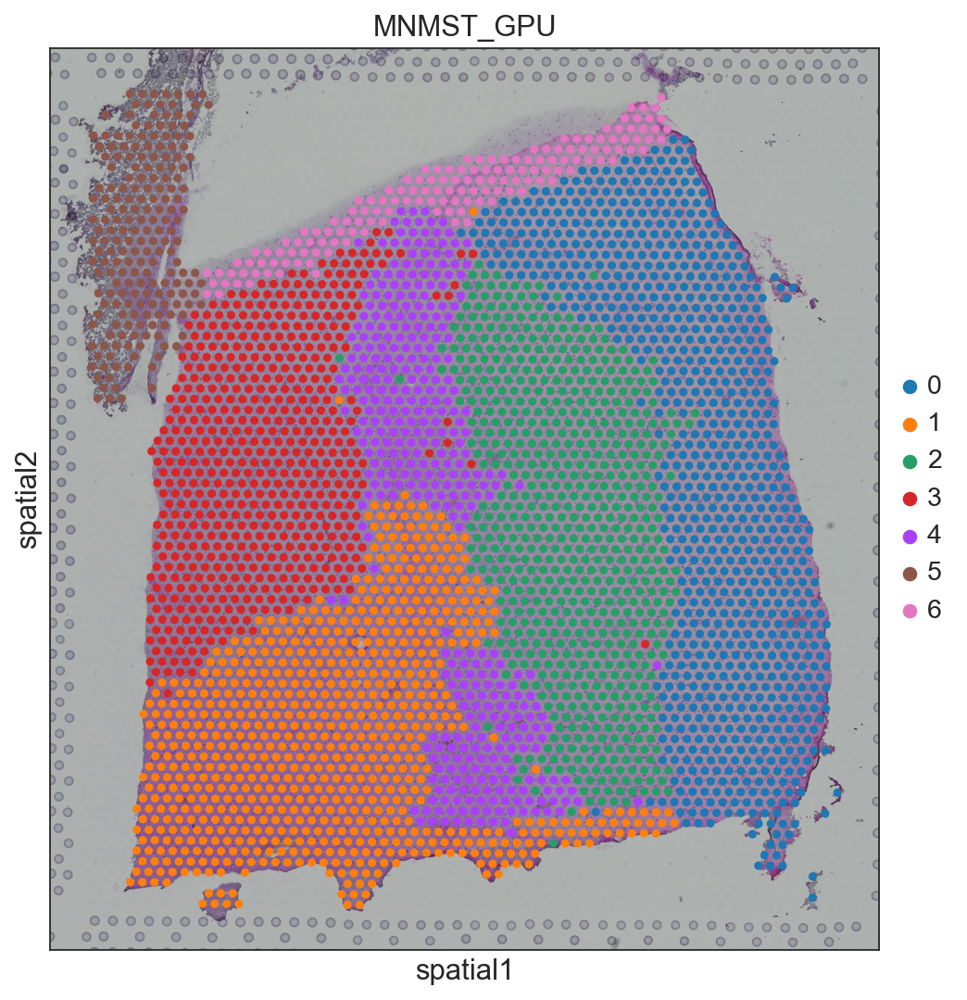

In [38]:
key_added = 'representation'
conns_key = 'representation'
dists_key = 'representation'

enhanced_data.uns[key_added] = {}
    
representation_dict = enhanced_data.uns[key_added]
    
representation_dict['connectivities_key'] = conns_key
representation_dict['distances_key'] = dists_key
representation_dict['var_names_use'] = enhanced_data.var_names.to_numpy()
    
representation_dict['params'] = {}
representation_dict['params']['method'] = 'umap'
enhanced_data.obsp['representation'] = Z_gpu
sc.tl.leiden(enhanced_data, neighbors_key='representation', resolution=1, key_added='MNMST_GPU')
print(enhanced_data.obs['MNMST_GPU'])
sc.pl.spatial(enhanced_data, color=['MNMST_GPU'])

### It is evident that in DLPFC slices without significant morphological changes, integration of morphological information exhibits a counterproductive impact on spatial domain recognition tasks.
This result consistent with the experimental result of [MUSE](https://github.com/AltschulerWu-Lab/MUSE/issues/3) on DLPFC slices. Specifically, the substantial heterogeneity in transcription and morphology modalities contributes to an unsatisfactory spatial domain recognition result.

#### Nevertheless, MNMST continues to preserve the spatial structure of the white matter layer.

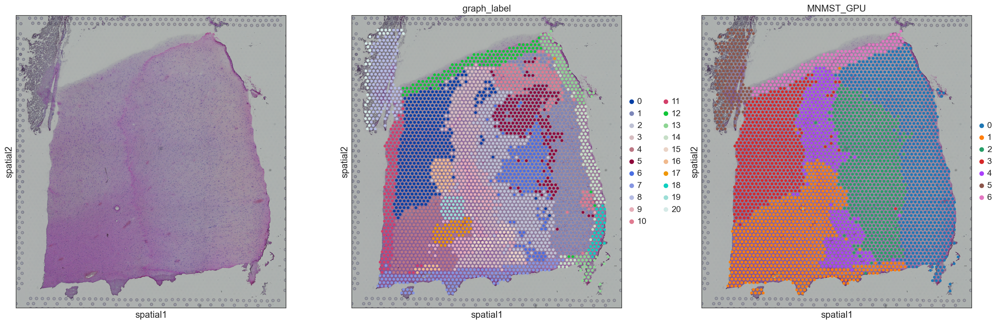

In [ ]:
sc.pl.spatial(enhanced_data, color=[None, 'graph_label', 'MNMST_GPU'])

In [ ]:
import psutil

cpu_info = f"CPU: {psutil.cpu_count(logical=False)} cores, {psutil.cpu_count()} threads"

gpu_info = "GPU: "
if torch.cuda.is_available():
    gpu_count = torch.cuda.device_count()
    for i in range(gpu_count):
        gpu_info += f"GPU {i + 1}: {torch.cuda.get_device_name(i)}, "
    gpu_info = gpu_info[:-2]
else:
    gpu_info += "No GPU available."

print(cpu_info)
print(gpu_info)